In [1]:
from optical_flow import *
import os
import imageio.v2 as imageio 
import albumentations as A
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
from utils import *
from data_loader import *
from train import * 
from segmentation import *
from obstacle_detection_utils import *

INFO:numexpr.utils:NumExpr defaulting to 8 threads.


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# Instantiate the model
object_model = ObjectDetectionModel().to(device)
object_model.eval()
save_path = "DeepLabV3_ResNet50.pt"
model = SegmentationModel(23)

load_path = f"DeepLabV3_ResNet50.pt"
if os.path.exists(load_path):
    model = torch.load(load_path)
    print(f"Loaded {save_path}")

cuda
Loaded DeepLabV3_ResNet50.pt


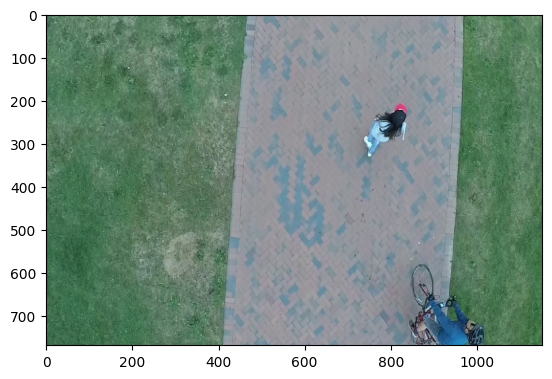

In [3]:
img_path = 'aeroscapes/JPEGImages'
mask_path = 'aeroscapes/SegmentationClass'

# Generate sorted lists of image and mask paths
images = sorted([os.path.join(img_path, i) for i in os.listdir(img_path)])
masks = sorted([os.path.join(mask_path, i) for i in os.listdir(mask_path)])

idx = 1124


img = imageio.imread(images[idx])
mask = imageio.imread(masks[idx])

# Define transformation
t_test = A.Resize(768, 1152, interpolation=cv2.INTER_NEAREST)

# Apply the transformation to the image
transformed = t_test(image=img)
img = transformed['image']
plt.imshow(img)
transformed_mask = t_test(image=mask)
mask = transformed_mask['image']
mask = torch.from_numpy(mask)


In [4]:
prev_img = imageio.imread(images[idx - 1])
curr_img = imageio.imread(images[idx])

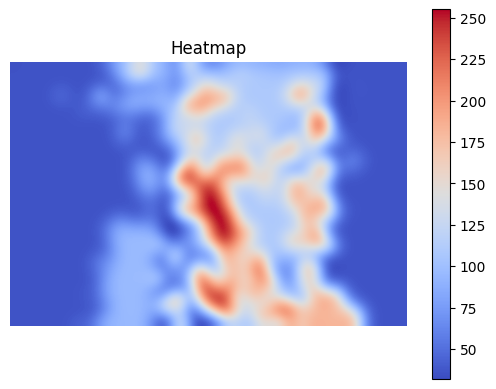

In [8]:
pred_mask, score, _ = predict_image_mask_miou_pixel_accuracy(model, img, mask, device)
seg_img = pred_mask.cpu().numpy()

risk_array = get_risk_map(seg_img, labels, risk_table, gaussian_sigma=25)
visualize_heatmap(risk_array)

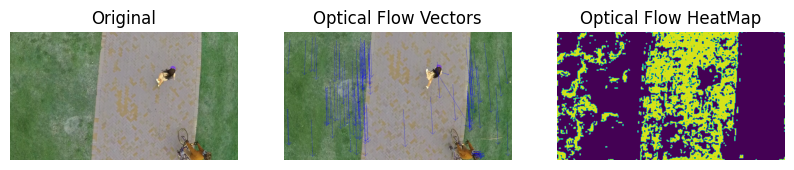

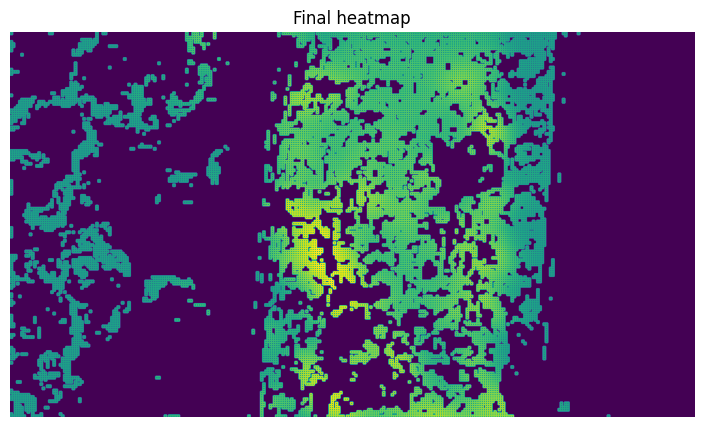

In [9]:
# frame1 = "040001_008.jpg"
# frame2 = "040001_009.jpg"
segmentation = risk_array
heat_map = optical_flow_heatmap(prev_img, curr_img)
final = final_combined_heatmap(heat_map, segmentation)

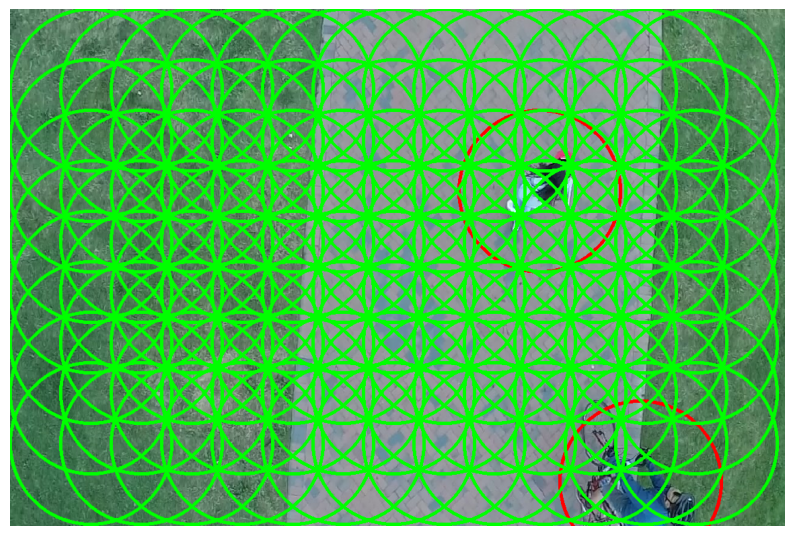

In [10]:
# Detect obstacles on the first image in the batch
boxes, labels = detect_obstacles(object_model, img, device)

# Find obstacles list in format (x, y, min_safe_radius)
obstacles = define_no_landing_zones(boxes, labels)

# Generate list of lzs proposal that meet the min safe distance of all the obstacles
zones_proposed = get_landing_zones_proposals(obstacles, 75, 120, img)

draw_lzs_obs(zones_proposed, obstacles, img, thickness=3)

In [11]:
lzsSorted = rank_lzs(zones_proposed, final, obstacles, weightDist=5, weightRisk=15, weightOb=5)

# Extract all confidence values before normalization
confidence_values = [item['confidence'] for item in lzsSorted]

# # Calculate the average confidence
# average_confidence = sum(confidence_values) / len(confidence_values)

# Find the minimum and maximum confidence values
min_confidence = min(confidence_values)
max_confidence = max(confidence_values)

print(f"Min Confidence: {min_confidence}")
print(f"Max Confidence: {max_confidence}")

# Normalize the confidence values to be between 0 and 1
for item in lzsSorted:
    item['confidence'] = (item['confidence'] - min_confidence) / (max_confidence - min_confidence)

# Extract all confidence values after normalization
confidence_values = [item['confidence'] for item in lzsSorted]

# Calculate the average confidence
average_confidence = sum(confidence_values) / len(confidence_values)

print(f"Average Confidence: {average_confidence}")

Min Confidence: 0
Max Confidence: 0.8731012333581175
Average Confidence: 0.46470315642179033


Length of Unfiltered List: 104
Length of Filtered List: 61


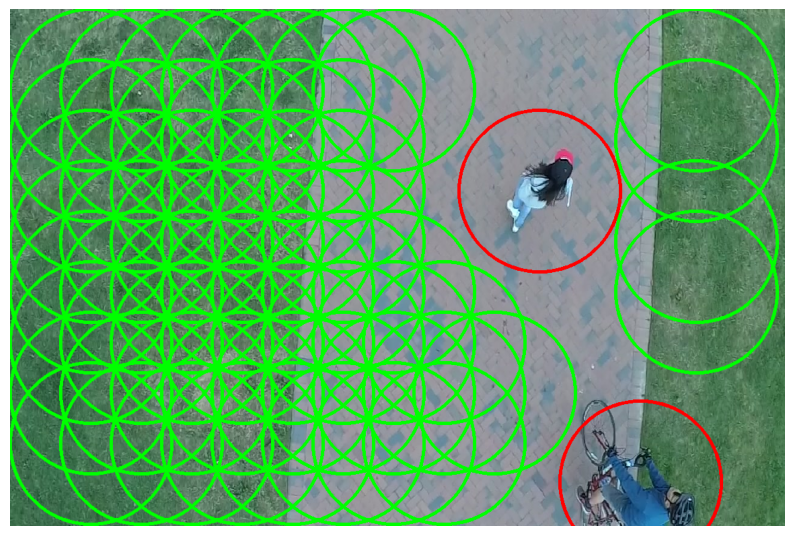

In [13]:
# Define the confidence threshold
confidence_threshold = 0.5

# Filter the list to remove dictionaries with confidence less than the threshold
filtered_lzsSorted = [item for item in lzsSorted if item['confidence'] >= confidence_threshold]

print(f"Length of Unfiltered List: {len(lzsSorted)}")
print(f"Length of Filtered List: {len(filtered_lzsSorted)}")

draw_lzs_obs(filtered_lzsSorted, obstacles, img, thickness=3)

In [17]:
torch.cuda.empty_cache()

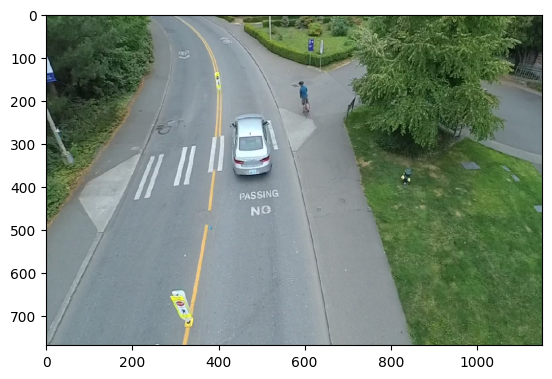

In [9]:
img_path = 'aeroscapes/JPEGImages'
mask_path = 'aeroscapes/SegmentationClass'

# Generate sorted lists of image and mask paths
images = sorted([os.path.join(img_path, i) for i in os.listdir(img_path)])
masks = sorted([os.path.join(mask_path, i) for i in os.listdir(mask_path)])

idx = 1590


img = imageio.imread(images[idx])
mask = imageio.imread(masks[idx])

# Define transformation
t_test = A.Resize(768, 1152, interpolation=cv2.INTER_NEAREST)

# Apply the transformation to the image
transformed = t_test(image=img)
img = transformed['image']
plt.imshow(img)
transformed_mask = t_test(image=mask)
mask = transformed_mask['image']
mask = torch.from_numpy(mask)


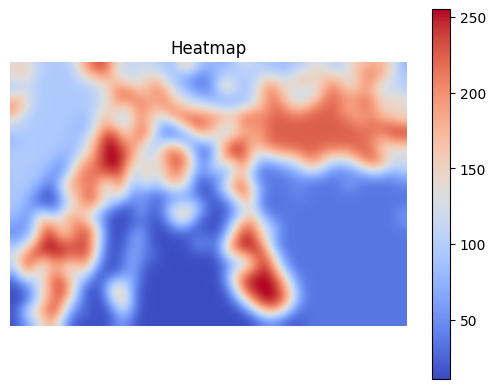

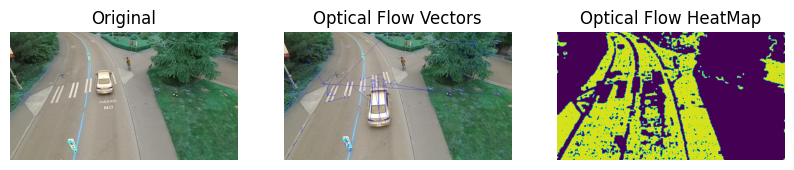

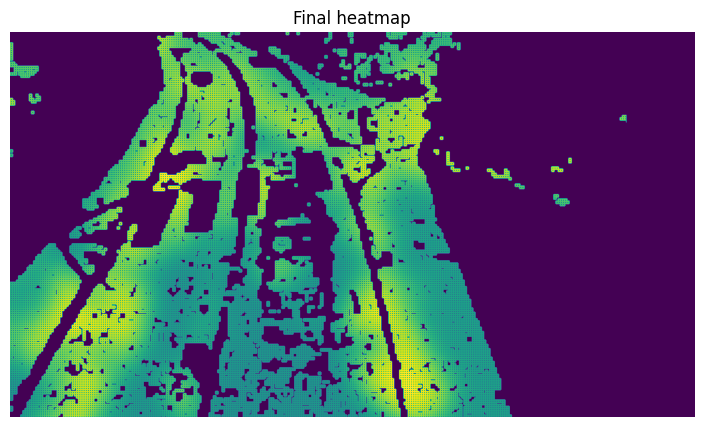

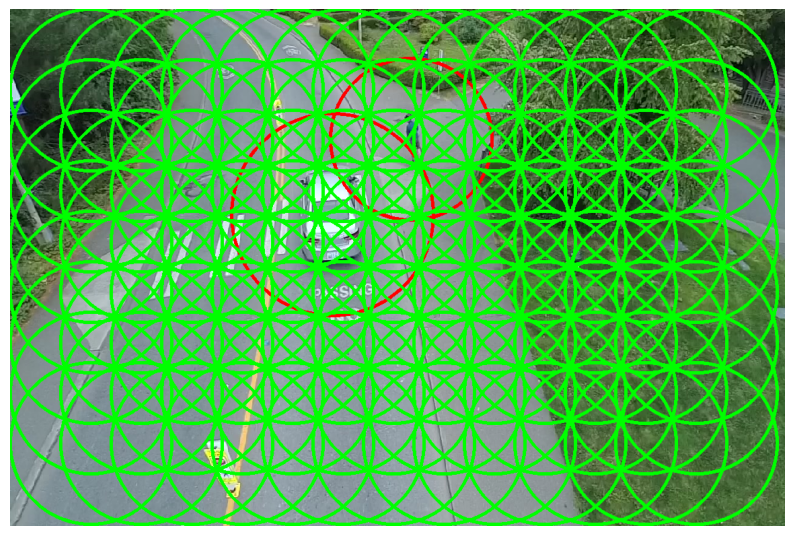

Min Confidence: 0
Max Confidence: 0.698882023437323
Average Confidence: 0.4833645519202774
Length of Unfiltered List: 104
Length of Filtered List: 61


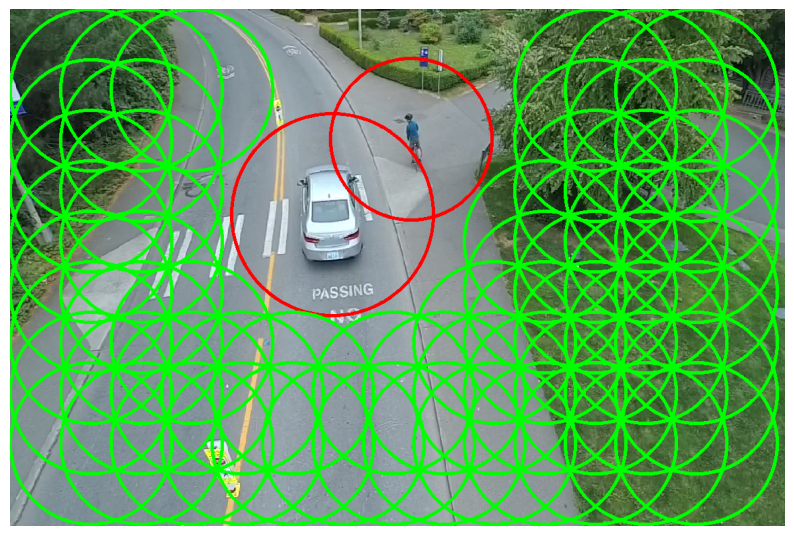

In [10]:
prev_img = imageio.imread(images[idx - 1])
curr_img = imageio.imread(images[idx])

pred_mask, score, _ = predict_image_mask_miou_pixel_accuracy(model, img, mask, device)
seg_img = pred_mask.cpu().numpy()

risk_array = get_risk_map(seg_img, labels, risk_table, gaussian_sigma=25)
visualize_heatmap(risk_array)

segmentation = risk_array
heat_map = optical_flow_heatmap(prev_img, curr_img)
final = final_combined_heatmap(heat_map, segmentation)

# Detect obstacles on the first image in the batch
boxes, labels = detect_obstacles(object_model, img, device)

# Find obstacles list in format (x, y, min_safe_radius)
obstacles = define_no_landing_zones(boxes, labels)

# Generate list of lzs proposal that meet the min safe distance of all the obstacles
zones_proposed = get_landing_zones_proposals(obstacles, 75, 120, img)

draw_lzs_obs(zones_proposed, obstacles, img, thickness=3)

lzsSorted = rank_lzs(
    zones_proposed, final, obstacles, weightDist=5, weightRisk=15, weightOb=5
)

# Extract all confidence values before normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# # Calculate the average confidence
# average_confidence = sum(confidence_values) / len(confidence_values)

# Find the minimum and maximum confidence values
min_confidence = min(confidence_values)
max_confidence = max(confidence_values)

print(f"Min Confidence: {min_confidence}")
print(f"Max Confidence: {max_confidence}")

# Normalize the confidence values to be between 0 and 1
for item in lzsSorted:
    item["confidence"] = (item["confidence"] - min_confidence) / (
        max_confidence - min_confidence
    )

# Extract all confidence values after normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# Calculate the average confidence
average_confidence = sum(confidence_values) / len(confidence_values)

print(f"Average Confidence: {average_confidence}")

# Define the confidence threshold
confidence_threshold = 0.5

# Filter the list to remove dictionaries with confidence less than the threshold
filtered_lzsSorted = [
    item for item in lzsSorted if item["confidence"] >= confidence_threshold
]

print(f"Length of Unfiltered List: {len(lzsSorted)}")
print(f"Length of Filtered List: {len(filtered_lzsSorted)}")

draw_lzs_obs(filtered_lzsSorted, obstacles, img, thickness=3)

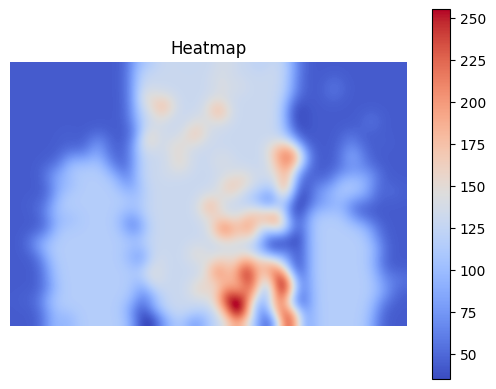

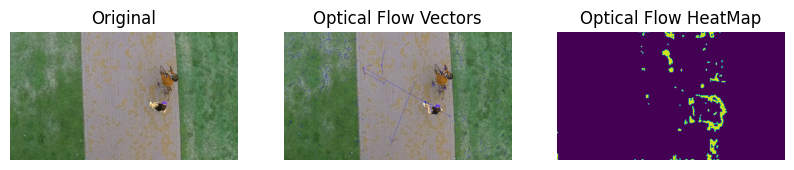

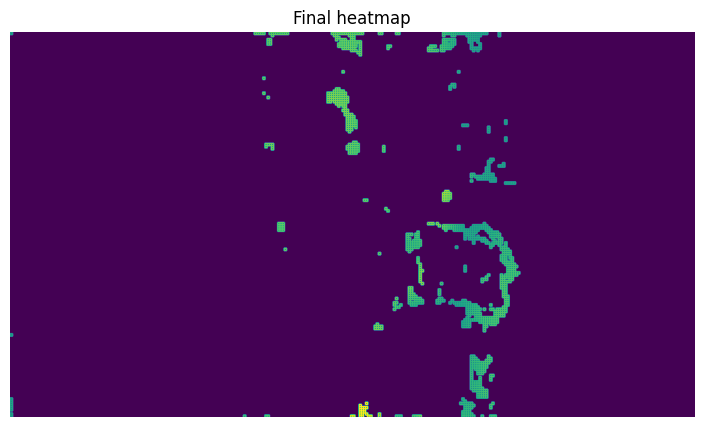

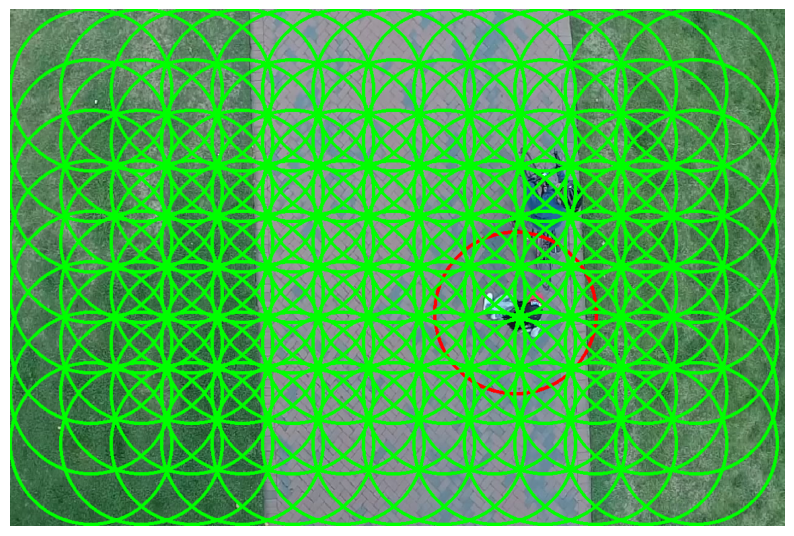

Min Confidence: 0
Max Confidence: 0.8567044692480417
Average Confidence: 0.5967136051745261
Length of Unfiltered List: 104
Length of Filtered List: 72


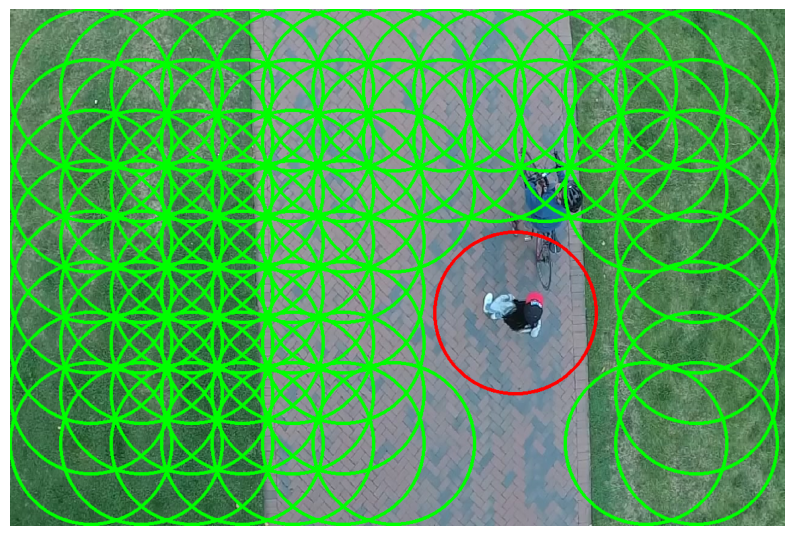

In [13]:
img_path = 'aeroscapes/JPEGImages'
mask_path = 'aeroscapes/SegmentationClass'

# Generate sorted lists of image and mask paths
images = sorted([os.path.join(img_path, i) for i in os.listdir(img_path)])
masks = sorted([os.path.join(mask_path, i) for i in os.listdir(mask_path)])

idx = 1809


img = imageio.imread(images[idx])
mask = imageio.imread(masks[idx])

# Define transformation
t_test = A.Resize(768, 1152, interpolation=cv2.INTER_NEAREST)

# Apply the transformation to the image
transformed = t_test(image=img)
img = transformed['image']
plt.imshow(img)
transformed_mask = t_test(image=mask)
mask = transformed_mask['image']
mask = torch.from_numpy(mask)

prev_img = imageio.imread(images[idx - 1])
curr_img = imageio.imread(images[idx])

pred_mask, score, _ = predict_image_mask_miou_pixel_accuracy(model, img, mask, device)
seg_img = pred_mask.cpu().numpy()

risk_array = get_risk_map(seg_img, labels, risk_table, gaussian_sigma=25)
visualize_heatmap(risk_array)

segmentation = risk_array
heat_map = optical_flow_heatmap(prev_img, curr_img)
final = final_combined_heatmap(heat_map, segmentation)

# Detect obstacles on the first image in the batch
boxes, labels = detect_obstacles(object_model, img, device)

# Find obstacles list in format (x, y, min_safe_radius)
obstacles = define_no_landing_zones(boxes, labels)

# Generate list of lzs proposal that meet the min safe distance of all the obstacles
zones_proposed = get_landing_zones_proposals(obstacles, 75, 120, img)

draw_lzs_obs(zones_proposed, obstacles, img, thickness=3)

lzsSorted = rank_lzs(
    zones_proposed, final, obstacles, weightDist=5, weightRisk=15, weightOb=5
)

# Extract all confidence values before normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# # Calculate the average confidence
# average_confidence = sum(confidence_values) / len(confidence_values)

# Find the minimum and maximum confidence values
min_confidence = min(confidence_values)
max_confidence = max(confidence_values)

print(f"Min Confidence: {min_confidence}")
print(f"Max Confidence: {max_confidence}")

# Normalize the confidence values to be between 0 and 1
for item in lzsSorted:
    item["confidence"] = (item["confidence"] - min_confidence) / (
        max_confidence - min_confidence
    )

# Extract all confidence values after normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# Calculate the average confidence
average_confidence = sum(confidence_values) / len(confidence_values)

print(f"Average Confidence: {average_confidence}")

# Define the confidence threshold
confidence_threshold = 0.5

# Filter the list to remove dictionaries with confidence less than the threshold
filtered_lzsSorted = [
    item for item in lzsSorted if item["confidence"] >= confidence_threshold
]

print(f"Length of Unfiltered List: {len(lzsSorted)}")
print(f"Length of Filtered List: {len(filtered_lzsSorted)}")

draw_lzs_obs(filtered_lzsSorted, obstacles, img, thickness=3)

In [1]:
from optical_flow import *
import os
import imageio.v2 as imageio 
import albumentations as A
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
from utils import *
from data_loader import *
from train import * 
from segmentation import *
from obstacle_detection_utils import *

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# Instantiate the model
object_model = ObjectDetectionModel().to(device)
object_model.eval()
save_path = "DeepLabV3_ResNet50.pt"
model = SegmentationModel(23)

load_path = f"DeepLabV3_ResNet50.pt"
if os.path.exists(load_path):
    model = torch.load(load_path)
    print(f"Loaded {save_path}")

INFO:numexpr.utils:NumExpr defaulting to 8 threads.


cuda
Loaded DeepLabV3_ResNet50.pt


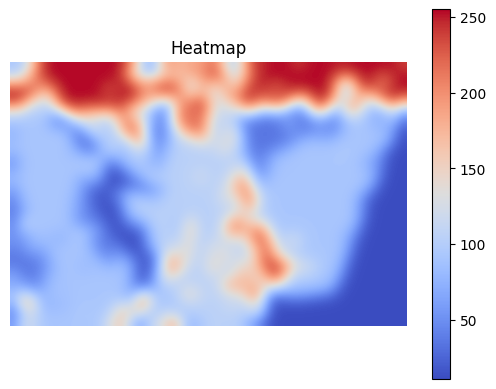

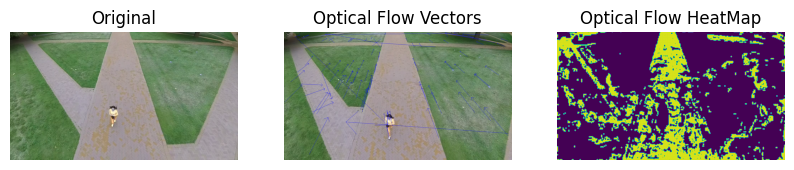

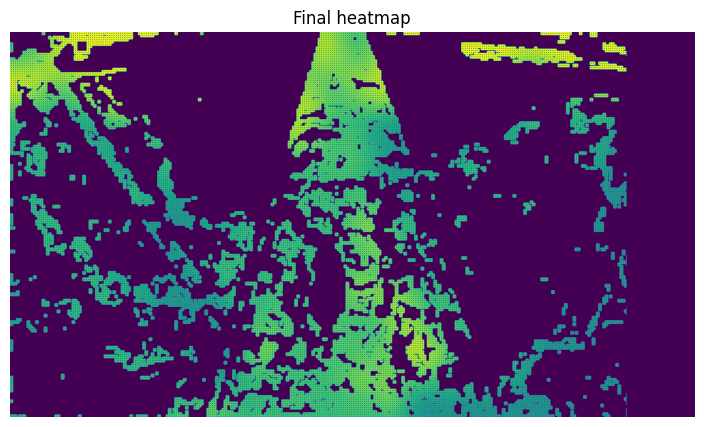

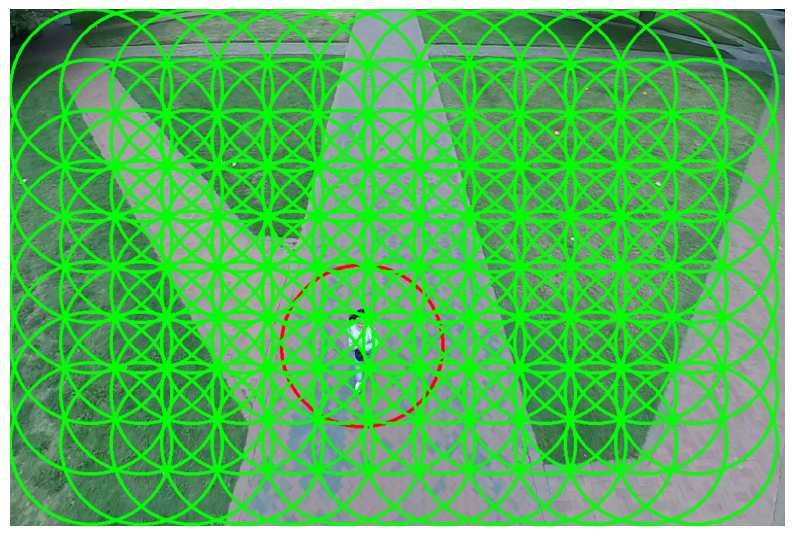

Min Confidence: 0
Max Confidence: 0.7755180662721048
Average Confidence: 0.5789578323524313
Length of Unfiltered List: 104
Length of Filtered List: 74


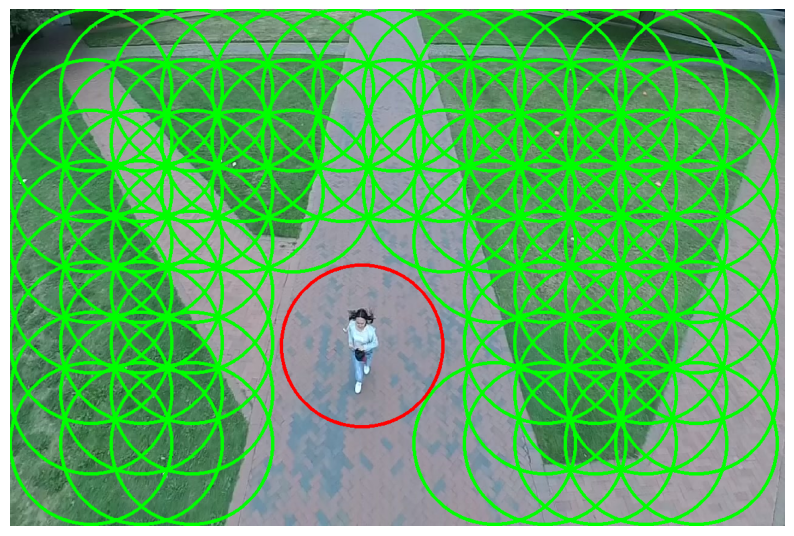

In [2]:
img_path = 'aeroscapes/JPEGImages'
mask_path = 'aeroscapes/SegmentationClass'

# Generate sorted lists of image and mask paths
images = sorted([os.path.join(img_path, i) for i in os.listdir(img_path)])
masks = sorted([os.path.join(mask_path, i) for i in os.listdir(mask_path)])

idx = 1082


img = imageio.imread(images[idx])
mask = imageio.imread(masks[idx])

# Define transformation
t_test = A.Resize(768, 1152, interpolation=cv2.INTER_NEAREST)

# Apply the transformation to the image
transformed = t_test(image=img)
img = transformed['image']
plt.imshow(img)
transformed_mask = t_test(image=mask)
mask = transformed_mask['image']
mask = torch.from_numpy(mask)

prev_img = imageio.imread(images[idx - 1])
curr_img = imageio.imread(images[idx])

pred_mask, score, _ = predict_image_mask_miou_pixel_accuracy(model, img, mask, device)
seg_img = pred_mask.cpu().numpy()

risk_array = get_risk_map(seg_img, labels, risk_table, gaussian_sigma=25)
visualize_heatmap(risk_array)

segmentation = risk_array
heat_map = optical_flow_heatmap(prev_img, curr_img)
final = final_combined_heatmap(heat_map, segmentation)

# Detect obstacles on the first image in the batch
boxes, labels = detect_obstacles(object_model, img, device)

# Find obstacles list in format (x, y, min_safe_radius)
obstacles = define_no_landing_zones(boxes, labels)

# Generate list of lzs proposal that meet the min safe distance of all the obstacles
zones_proposed = get_landing_zones_proposals(obstacles, 75, 120, img)

draw_lzs_obs(zones_proposed, obstacles, img, thickness=3)

lzsSorted = rank_lzs(
    zones_proposed, final, obstacles, weightDist=5, weightRisk=15, weightOb=5
)

# Extract all confidence values before normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# # Calculate the average confidence
# average_confidence = sum(confidence_values) / len(confidence_values)

# Find the minimum and maximum confidence values
min_confidence = min(confidence_values)
max_confidence = max(confidence_values)

print(f"Min Confidence: {min_confidence}")
print(f"Max Confidence: {max_confidence}")

# Normalize the confidence values to be between 0 and 1
for item in lzsSorted:
    item["confidence"] = (item["confidence"] - min_confidence) / (
        max_confidence - min_confidence
    )

# Extract all confidence values after normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# Calculate the average confidence
average_confidence = sum(confidence_values) / len(confidence_values)

print(f"Average Confidence: {average_confidence}")

# Define the confidence threshold
confidence_threshold = 0.5

# Filter the list to remove dictionaries with confidence less than the threshold
filtered_lzsSorted = [
    item for item in lzsSorted if item["confidence"] >= confidence_threshold
]

print(f"Length of Unfiltered List: {len(lzsSorted)}")
print(f"Length of Filtered List: {len(filtered_lzsSorted)}")

draw_lzs_obs(filtered_lzsSorted, obstacles, img, thickness=3)

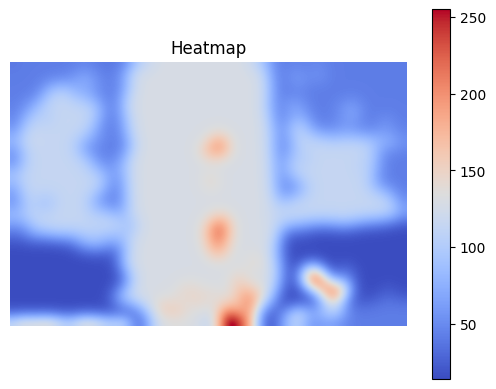

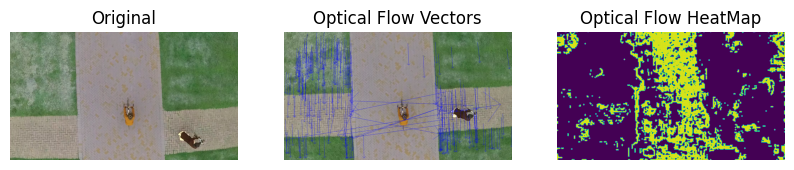

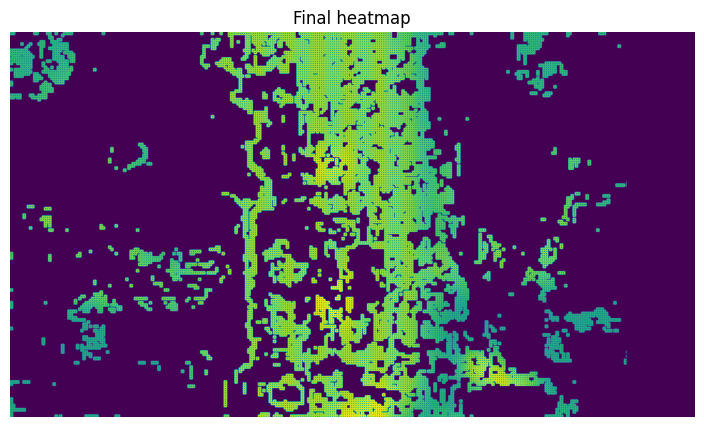

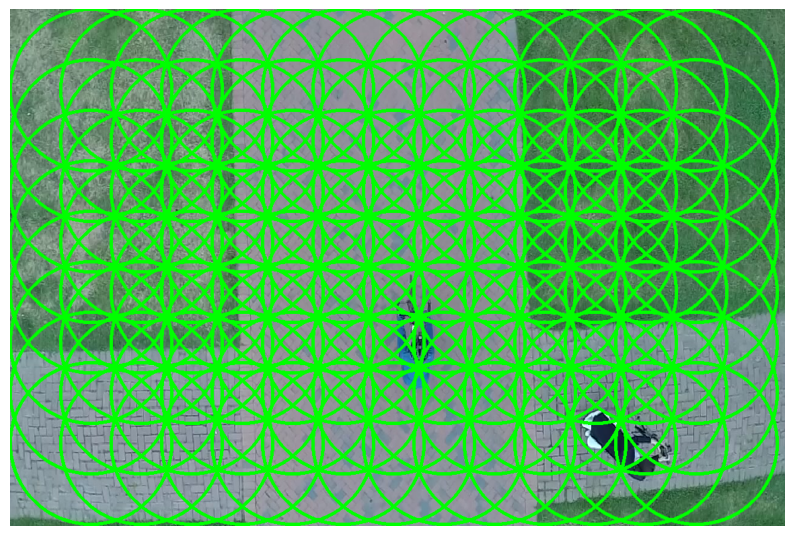

Min Confidence: 0.2759105479130881
Max Confidence: 0.7744662814663127
Average Confidence: 0.5836075838931148
Length of Unfiltered List: 104
Length of Filtered List: 75


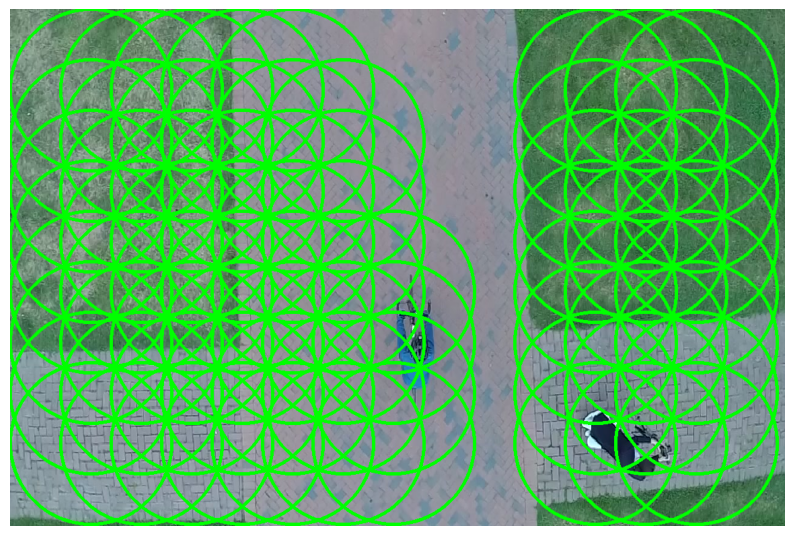

In [2]:
img_path = 'aeroscapes/JPEGImages'
mask_path = 'aeroscapes/SegmentationClass'

# Generate sorted lists of image and mask paths
images = sorted([os.path.join(img_path, i) for i in os.listdir(img_path)])
masks = sorted([os.path.join(mask_path, i) for i in os.listdir(mask_path)])

idx = 1890


img = imageio.imread(images[idx])
mask = imageio.imread(masks[idx])

# Define transformation
t_test = A.Resize(768, 1152, interpolation=cv2.INTER_NEAREST)

# Apply the transformation to the image
transformed = t_test(image=img)
img = transformed['image']
plt.imshow(img)
transformed_mask = t_test(image=mask)
mask = transformed_mask['image']
mask = torch.from_numpy(mask)

prev_img = imageio.imread(images[idx - 1])
curr_img = imageio.imread(images[idx])

pred_mask, score, _ = predict_image_mask_miou_pixel_accuracy(model, img, mask, device)
seg_img = pred_mask.cpu().numpy()

risk_array = get_risk_map(seg_img, labels, risk_table, gaussian_sigma=25)
visualize_heatmap(risk_array)

segmentation = risk_array
heat_map = optical_flow_heatmap(prev_img, curr_img)
final = final_combined_heatmap(heat_map, segmentation)

# Detect obstacles on the first image in the batch
boxes, labels = detect_obstacles(object_model, img, device)

# Find obstacles list in format (x, y, min_safe_radius)
obstacles = define_no_landing_zones(boxes, labels)

# Generate list of lzs proposal that meet the min safe distance of all the obstacles
zones_proposed = get_landing_zones_proposals(obstacles, 75, 120, img)

draw_lzs_obs(zones_proposed, obstacles, img, thickness=3)

lzsSorted = rank_lzs(
    zones_proposed, final, obstacles, weightDist=5, weightRisk=15, weightOb=5
)

# Extract all confidence values before normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# # Calculate the average confidence
# average_confidence = sum(confidence_values) / len(confidence_values)

# Find the minimum and maximum confidence values
min_confidence = min(confidence_values)
max_confidence = max(confidence_values)

print(f"Min Confidence: {min_confidence}")
print(f"Max Confidence: {max_confidence}")

# Normalize the confidence values to be between 0 and 1
for item in lzsSorted:
    item["confidence"] = (item["confidence"] - min_confidence) / (
        max_confidence - min_confidence
    )

# Extract all confidence values after normalization
confidence_values = [item["confidence"] for item in lzsSorted]

# Calculate the average confidence
average_confidence = sum(confidence_values) / len(confidence_values)

print(f"Average Confidence: {average_confidence}")

# Define the confidence threshold
confidence_threshold = 0.5

# Filter the list to remove dictionaries with confidence less than the threshold
filtered_lzsSorted = [
    item for item in lzsSorted if item["confidence"] >= confidence_threshold
]

print(f"Length of Unfiltered List: {len(lzsSorted)}")
print(f"Length of Filtered List: {len(filtered_lzsSorted)}")

draw_lzs_obs(filtered_lzsSorted, obstacles, img, thickness=3)